In [1]:
dataname="trg_multi"

#files=glob.glob('*.png')
#fname=files[3]
#fname="../../slide-2019-09-24T09-52-40-R1-S1.mrxs.png"
fname = 'test1.png'

In [2]:
class_names=["Fat", "Muscular", "Vessle", "Gland", "Stroma", "Tumor", "Necrosis", "Epithelium"]
nclasses=len(class_names)

In [3]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import scipy.signal
import argparse
from torch import nn
from torchsummary import summary

from skimage import color 

from albumentations import *
from albumentations.pytorch import ToTensor

import sklearn.feature_extraction.image

import matplotlib.cm

import torch

from torchvision.models import DenseNet

from tqdm.autonotebook import tqdm

from  skimage.color import rgb2gray
import PIL

import glob

import dill as pickle

from skimage.color import rgb2gray, rgb2hed

from skimage.measure import * 
from skimage.filters import *
from skimage.morphology import *


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [4]:
def blend2Images(img, mask):
    if (img.ndim == 3):
        img = color.rgb2gray(img)
    if (mask.ndim == 3):
        mask = color.rgb2gray(mask)
    img = img[:, :, None] * 1.0  # can't use boolean
    mask = mask[:, :, None] * 1.0
    out = np.concatenate((mask, img, mask), 2)
    return out

In [5]:
def divide_batch(l, n): 
    for i in range(0, l.shape[0], n):  
        yield l[i:i + n,::] 

In [44]:
# create a function to make output from the image, mask, set of points
def MakeOutput(model, img, mask, rs, cs, patch_size, patch_size_res2):
    assert img.shape == mask.shape
    assert len(rs) == len(cs)
    centers = [ (r,c) for r,c in zip(rs,cs)]
    npatches=len(centers)
    arr_out_res1 = np.zeros((npatches,3,patch_size,patch_size))
    arr_out_res2 = np.zeros((npatches,3,patch_size,patch_size))
    img_transform = Compose([
       ToTensor()
    ])
    rs=[]
    cs=[]
    for i, (r,c) in tqdm(enumerate(centers), total = len(centers)):
        r=int(round(r))
        c=int(round(c))
        rs.append(r)
        cs.append(c)

        imgres1 = img[r-patch_size//2:r+patch_size//2,c-patch_size//2:c+patch_size//2,:]
            
        imgres2 = img[r-patch_size_res2//2:r+patch_size_res2//2,c-patch_size_res2//2:c+patch_size_res2//2,:]
        imgres2 = cv2.resize(imgres2,(patch_size,patch_size), interpolation=PIL.Image.BICUBIC) #resize it as specified above

    
        arr_out_res1[i,:,:,:] = img_transform(image=imgres1)["image"]
        arr_out_res2[i,:,:,:] = img_transform(image=imgres2)["image"]
    clusterids=[]
    for batch_arr_res1, batch_arr_res2 in tqdm(zip(divide_batch(arr_out_res1,batch_size),divide_batch(arr_out_res2,batch_size))):

        #arr_out_gpu = torch.from_numpy(batch_arr.transpose(0, 3, 1, 2) / 255).type('torch.FloatTensor').to(device)
        arr_out_gpu_res1 =  torch.from_numpy(batch_arr_res1).type('torch.FloatTensor').to(device)
        arr_out_gpu_res2 =  torch.from_numpy(batch_arr_res2).type('torch.FloatTensor').to(device)

        # ---- get results
        clusterids.append(torch.argmax( model.dualfoward(arr_out_gpu_res1,arr_out_gpu_res2),dim=1).detach().cpu().numpy())
    clusterids=np.hstack(clusterids)
    return clusterids

In [45]:
def random_subset(a, b, nitems):
    assert len(a) == len(b)
    idx = np.random.randint(0,len(a),nitems)
    return a[idx], b[idx]

In [46]:
def subset(a, b, nitems):
    assert len(a)==len(b)
    idx = np.arange(0, len(a), len(a)//nitems)
    return a[idx], b[idx]

In [48]:
def Preprocess(img, resize, mirror_pad_size):
    img= cv2.resize(img,(0,0),fx=resize_resolutions[0],fy=resize_resolutions[0], interpolation=PIL.Image.BICUBIC) #resize it as specified above
    img = np.pad(img, [(mirror_pad_size, mirror_pad_size), (mirror_pad_size, mirror_pad_size), (0, 0)], mode="reflect")
    # creat the coresponding mask
    hed=rgb2hed(img)
    mask=hed[:,:,0]>-.8
    mask=remove_small_objects(mask,150)

    mask[img.sum(axis=2)<100]=0

    mask[img.sum(axis=2)>700]=0

    mask[0:patch_size_res2,:]=0
    mask[:,0:patch_size_res2]=0

    mask[:,-patch_size_res2-1:]=0
    mask[-patch_size_res2-1:,:]=0
    return img, mask 

In [49]:
#Load model
device = torch.device('cuda')
checkpoint = torch.load("./trg_multi_simple_multires_best_model.pth", map_location=lambda storage, loc: storage)
from  MultiResSmallNetwork import MergeSmallNetworks
model=MergeSmallNetworks(nclasses = nclasses, outputsize = 8 ).to(device)
model.load_state_dict(checkpoint["model_dict"])

<All keys matched successfully>

In [50]:
# resize and pad the image
resize_resolutions=[1,.25] #resize input image, base and second

patch_size=64
patch_size_res2 = int(patch_size  * 1/resize_resolutions[1])
mirror_pad_size = patch_size_res2

batch_size=128 #should be a power of 2

cmap= matplotlib.cm.tab10
img = cv2.cvtColor(cv2.imread(fname),cv2.COLOR_BGR2RGB)
img, mask = Preprocess(img, resize_resolutions[0], mirror_pad_size)

In [51]:
print(img.shape, mask.shape)

(788, 1012, 3) (788, 1012)


In [53]:
mask

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [83]:
def CenterSLIC(img, mask, n_segments): 
    import matplotlib.pyplot as plt
    import numpy as np
    from skimage.color import rgb2gray
    from skimage.filters import sobel
    from skimage.segmentation import slic
    from skimage.util import img_as_float
    from skimage import data, util
    from skimage.measure import label, regionprops, regionprops_table
    segments_slic = slic(img, n_segments=n_segments, compactness=10, sigma=1, enforce_connectivity=True)
    regions = regionprops(segments_slic)
    centers = [(round(regions[i].centroid[0]),round(regions[i].centroid[1])) for i in range(len(regions))]
    return centers

In [88]:
def Intersection(lst1, lst2):  
    return list(set(lst1) & set(lst2))

In [91]:
centers = Intersection(CenterSLIC(img, mask, 1000), zip(*np.nonzero(mask)))

In [92]:
centers

[(521.0, 538.0),
 (307.0, 358.0),
 (427.0, 347.0),
 (449.0, 521.0),
 (463.0, 612.0),
 (310.0, 692.0),
 (263.0, 655.0),
 (350.0, 457.0),
 (369.0, 427.0),
 (330.0, 588.0),
 (476.0, 661.0),
 (401.0, 438.0),
 (494.0, 576.0),
 (413.0, 749.0),
 (325.0, 411.0),
 (427.0, 403.0),
 (299.0, 429.0),
 (319.0, 348.0),
 (518.0, 713.0),
 (322.0, 297.0),
 (433.0, 668.0),
 (408.0, 465.0),
 (518.0, 512.0),
 (264.0, 467.0),
 (432.0, 627.0),
 (384.0, 604.0),
 (287.0, 381.0),
 (402.0, 515.0),
 (384.0, 682.0),
 (472.0, 588.0),
 (347.0, 707.0),
 (352.0, 418.0),
 (498.0, 621.0),
 (476.0, 708.0),
 (518.0, 438.0),
 (458.0, 438.0),
 (457.0, 463.0),
 (288.0, 660.0),
 (293.0, 459.0),
 (346.0, 378.0),
 (319.0, 741.0),
 (266.0, 365.0),
 (378.0, 552.0),
 (322.0, 537.0),
 (440.0, 724.0),
 (483.0, 517.0),
 (373.0, 724.0),
 (436.0, 706.0),
 (383.0, 654.0),
 (514.0, 493.0),
 (271.0, 550.0),
 (353.0, 742.0),
 (431.0, 549.0),
 (438.0, 372.0),
 (440.0, 584.0),
 (319.0, 669.0),
 (297.0, 577.0),
 (435.0, 494.0),
 (405.0, 574.0

In [ ]:
#Choose points to make outputs
[rs,cs]=mask.nonzero()
#[rs,cs]=subset(rs,cs,min(max_number_samples, len(rs)))
[rs,cs]=random_subset(rs,cs,max_number_samples)

In [14]:
import scipy.ndimage as ndimage
img_fill_holes=ndimage.binary_fill_holes(mask).astype(int)

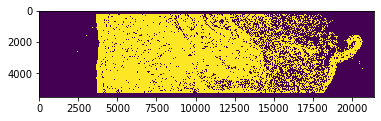

In [15]:
plt.imshow(mask)

In [18]:
max_number_samples=100000
[rs,cs]=mask.nonzero()
[rs,cs]=subset(rs,cs,min(max_number_samples, len(rs)))
#[rs,cs]=random_subset(rs,cs,max_number_samples)
centers = [ (r,c) for r,c in zip(rs,cs)]
npatches=len(centers)

arr_out_res1 = np.zeros((npatches,3,patch_size,patch_size))
arr_out_res2 = np.zeros((npatches,3,patch_size,patch_size))

In [19]:
img_transform = Compose([
       ToTensor()
    ])

In [20]:
rs=[]
cs=[]
for i, (r,c) in tqdm(enumerate(centers), total = len(centers)):
    r=int(round(r))
    c=int(round(c))
    rs.append(r)
    cs.append(c)

    imgres1 = img[r-patch_size//2:r+patch_size//2,c-patch_size//2:c+patch_size//2,:]
            
    imgres2 = img[r-patch_size_res2//2:r+patch_size_res2//2,c-patch_size_res2//2:c+patch_size_res2//2,:]
    imgres2 = cv2.resize(imgres2,(patch_size,patch_size), interpolation=PIL.Image.BICUBIC) #resize it as specified above

    
    arr_out_res1[i,:,:,:] = img_transform(image=imgres1)["image"]
    arr_out_res2[i,:,:,:] = img_transform(image=imgres2)["image"]

    
    

In [21]:
clusterids=[]
for batch_arr_res1, batch_arr_res2 in tqdm(zip(divide_batch(arr_out_res1,batch_size),divide_batch(arr_out_res2,batch_size))):

    #arr_out_gpu = torch.from_numpy(batch_arr.transpose(0, 3, 1, 2) / 255).type('torch.FloatTensor').to(device)
    arr_out_gpu_res1 =  torch.from_numpy(batch_arr_res1).type('torch.FloatTensor').to(device)
    arr_out_gpu_res2 =  torch.from_numpy(batch_arr_res2).type('torch.FloatTensor').to(device)

    # ---- get results
    clusterids.append(torch.argmax( model.dualfoward(arr_out_gpu_res1,arr_out_gpu_res2),dim=1).detach().cpu().numpy())
clusterids=np.hstack(clusterids)

In [38]:
imgsmall = cv2.resize(img,(0,0),fx=0.05,fy=0.05, interpolation=PIL.Image.BICUBIC)[:, 100:600]
imgsmall = cv2.cvtColor(imgsmall,cv2.COLOR_RGB2BGR)
cv2.imwrite('test.png', imgsmall)

True

<IPython.core.display.Javascript object>


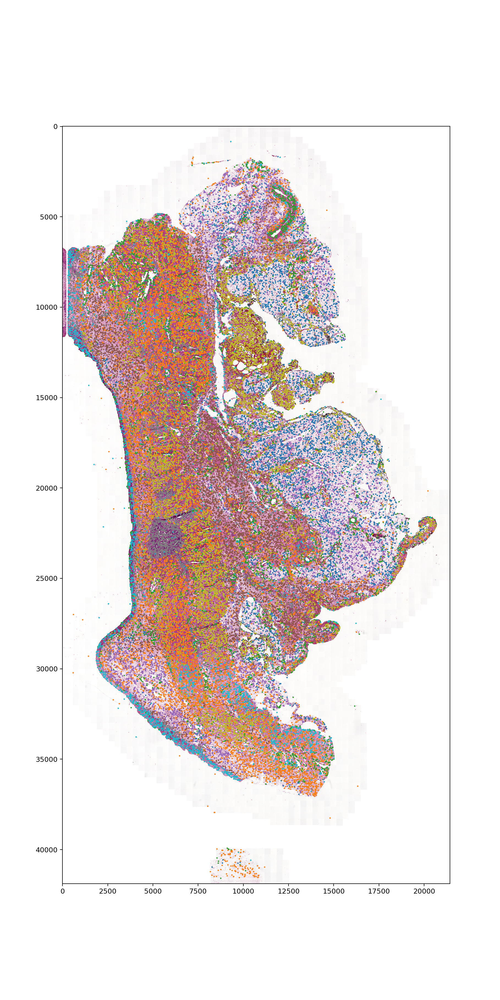

In [20]:
#%matplotlib notebook
#plt.rcParams["figure.figsize"] = [10, 20]
#fig, ax = plt.subplots()
#ax.imshow(img)
#ax.scatter(cs,rs,c=clusterids,cmap=cmap,s=1)

In [23]:
from collections import Counter
Counter(clusterids)

Counter({7: 6194,
         4: 26208,
         1: 21009,
         5: 8272,
         6: 8003,
         3: 4398,
         0: 15298,
         2: 10632})

In [24]:
C = [(float(cs[j]), float(rs[j])) for j in range(len(centers)) if clusterids[j]==5] 

In [25]:
def saveList(myList,filename):
    # the filename should mention the extension 'npy'
    np.save(filename,myList)
    print("Saved successfully!")

In [26]:
def loadList(filename):
    # the filename should mention the extension 'npy'
    tempNumpyArray=np.load(filename)
    return tempNumpyArray.tolist()

In [27]:
# save the list of tumor points
saveList(C,'tumorpoints.npy')

Saved successfully!


In [28]:
# loading the list now 
tumorpoints=loadList('tumorpoints.npy')

In [34]:
len(tumorpoints)

8272

In [29]:
import sys
from descartes import PolygonPatch
import matplotlib.pyplot as plt
import alphashape
alpha_shape = alphashape.alphashape(tumorpoints, 0.016)

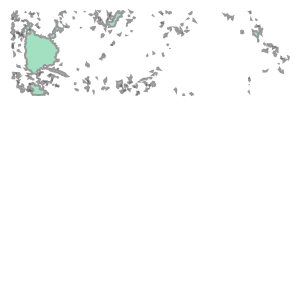

In [30]:
alpha_shape

<IPython.core.display.Javascript object>


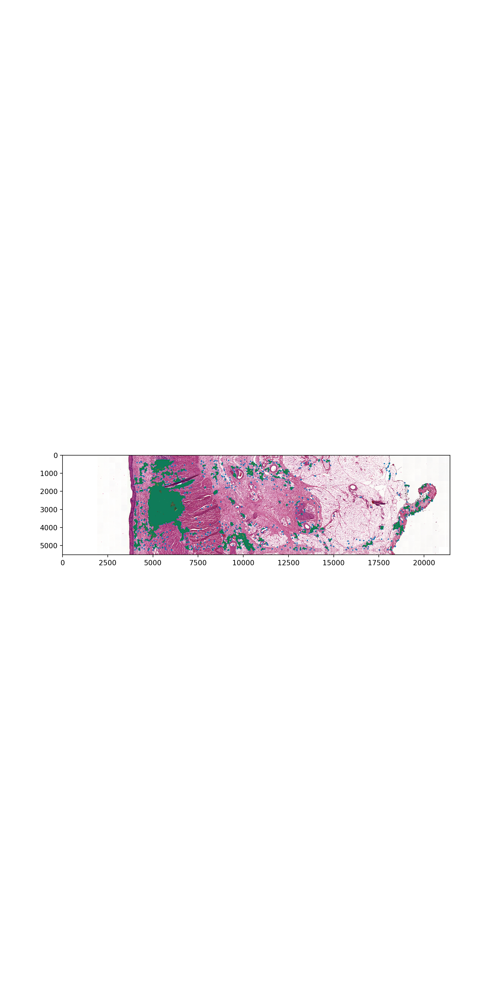

In [31]:
%matplotlib notebook
plt.rcParams["figure.figsize"] = [10, 20]
#ax.scatter(cs,rs,c=clusterids,cmap=cmap,s=1)
fig, ax = plt.subplots()
ax.imshow(img)
ax.scatter(*zip(*tumorpoints), s=1)
ax.add_patch(PolygonPatch(alpha_shape, alpha=0.5, color = 'green'))
plt.show()

In [33]:
fig.savefig('hull-multires-100000.png', bbox_inches='tight', dpi=1000)

SLIC number of segments: 202


<IPython.core.display.Javascript object>


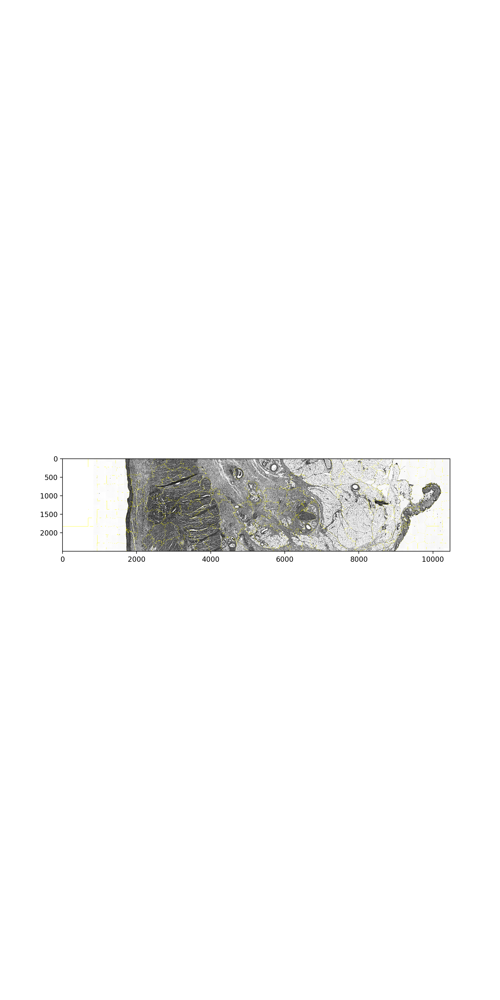

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [36]:
#SLIC
import matplotlib.pyplot as plt
import numpy as np
from skimage.data import astronaut
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
img2 = img_as_float(cv2.imread(fname)[::2, ::2])
segments_slic = slic(img2, n_segments=500, compactness=10, sigma=1, enforce_connectivity=True)
print(f"SLIC number of segments: {len(np.unique(segments_slic))}")
%matplotlib notebook
plt.rcParams["figure.figsize"] = [10, 20]
fig, ax = plt.subplots()
ax.imshow(mark_boundaries(rgb2gray(img2), segments_slic, color=(50, 50, 0), outline_color=None, background_label=0))

In [37]:
segments_slic

array([[  0,   0,   0, ...,  21,  21,  21],
       [  0,   0,   0, ...,  21,  21,  21],
       [  0,   0,   0, ...,  21,  21,  21],
       ...,
       [199, 199, 199, ..., 195, 195, 169],
       [199, 199, 199, ..., 195, 195, 169],
       [199, 199, 199, ..., 195, 195, 169]])

In [177]:
from shapely.geometry import shape
shape(alpha_shape).area 

3788179.5

<IPython.core.display.Javascript object>


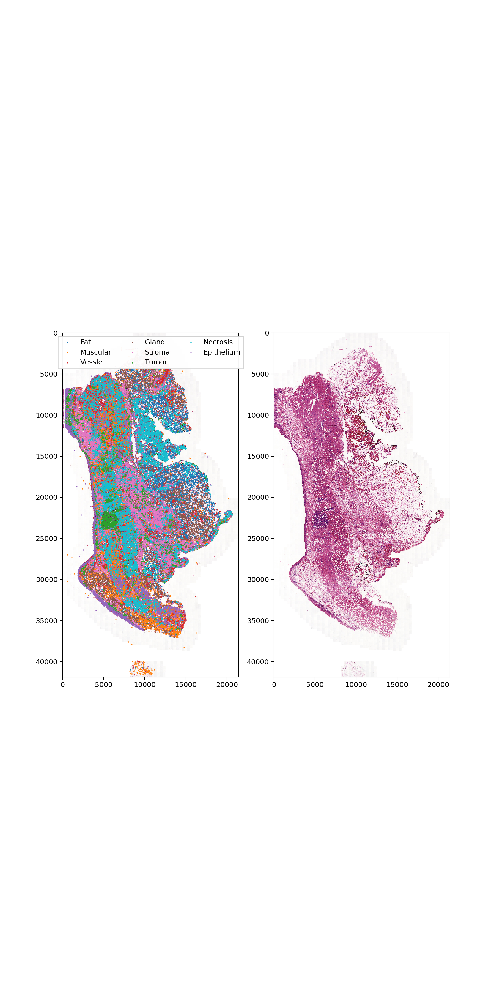

In [21]:
%matplotlib notebook
cdict = ['tab:blue','tab:orange','tab:red','tab:brown','tab:pink', 'tab:green', 'tab:cyan', 'tab:purple']
plt.rcParams["figure.figsize"] = [10, 20]
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(img)
ax2.imshow(img)
for i in range(len(class_names)):
    c = [cs[j] for j in range(len(centers)) if clusterids[j]==i]
    r = [rs[j] for j in range(len(centers)) if clusterids[j]==i]
    cl = [x for x in clusterids if x == i]  
    scatter = ax1.scatter(c, r, c=cdict[i], label = class_names[i], s=0.5)

# produce a legend with the unique colors from the scatter
legend1 = ax1.legend(loc="upper center", ncol=3, fancybox=False)
ax1.add_artist(legend1)

plt.show()

In [ ]:
fig.savefig('out-multires'+ fname, bbox_inches='tight', dpi=1000)

In [8]:
!pip install scikit-learn==0.21

Defaulting to user installation because normal site-packages is not writeable
  Using cached scikit_learn-0.21.0-cp36-cp36m-manylinux1_x86_64.whl (6.6 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1
